In [2]:
import os
import pandas as pd
from torchvision.io import read_image
import torch
from torch.utils.data import Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor
import matplotlib.pyplot as plt

# make filelists

In [8]:
imgs_path = "F:\\Bilder"
feats_path = "F:\\Features"
target_shape=(3, 84, 63) # <- HIER EINSTELLEN z.b. (3, 504, 378), (3, 252, 189),(3, 84, 63)  

torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 62]) False
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 62]) False
torch.Size([3, 84, 62]) False
torch.Size([3, 84, 63]) True


C:\Users\tadda\AppData\Local\Temp/ipykernel_9444/3865619365.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize= (12, 9))


torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 62]) False
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 62]) False
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 84]) False
torch.Size([3, 84, 62]) False
torch.Size([3, 84, 62]) False
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 62]) False
torch.Size([3, 84, 62]) False
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 62]) False
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.

torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 111]) False
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 112]) False
torch.Size([3, 84, 112]) False
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 111]) False
torch.Size([3, 84, 63]) True
torch.Size([3, 84, 63]) True


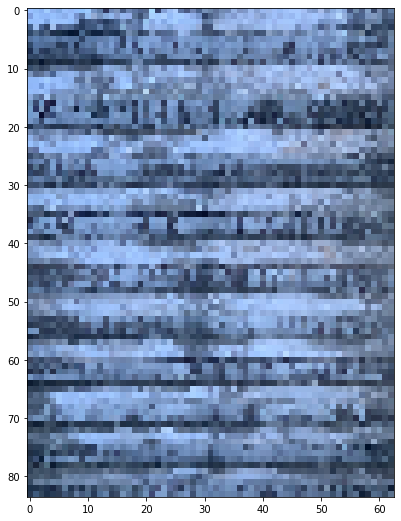

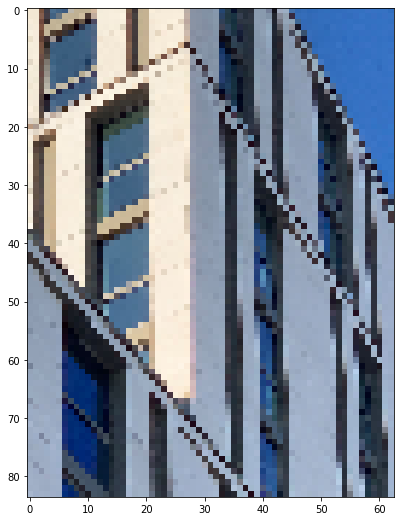

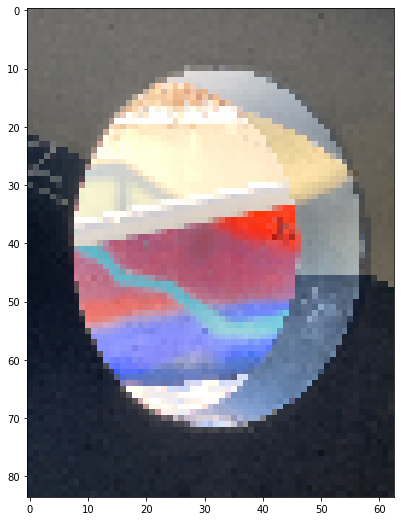

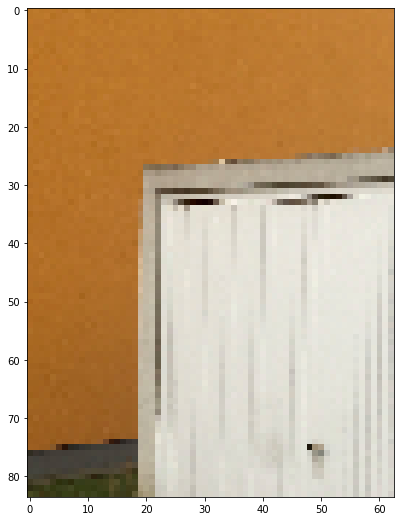

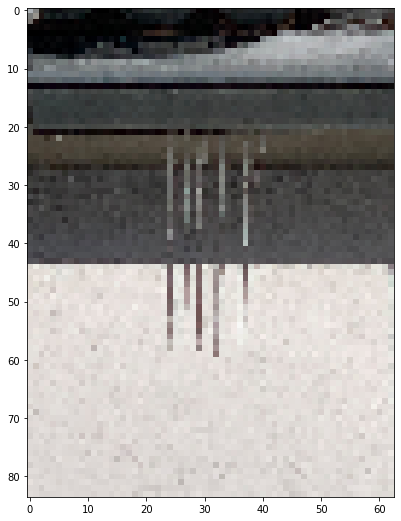

...

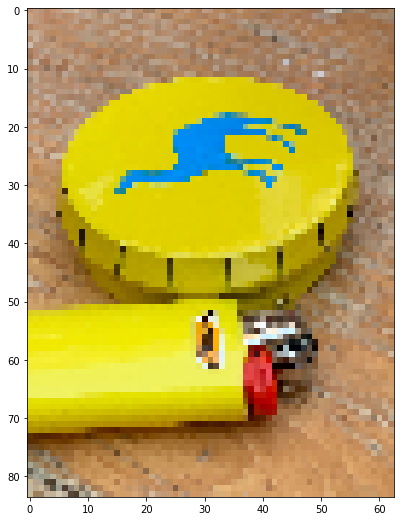

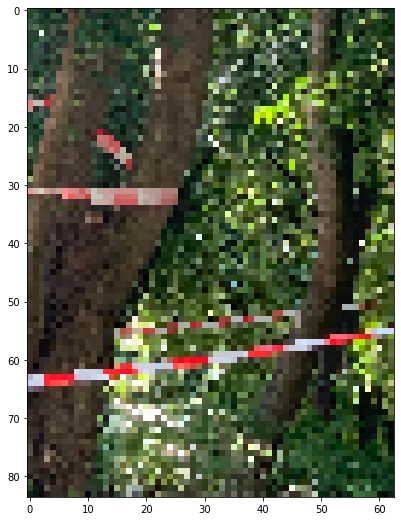

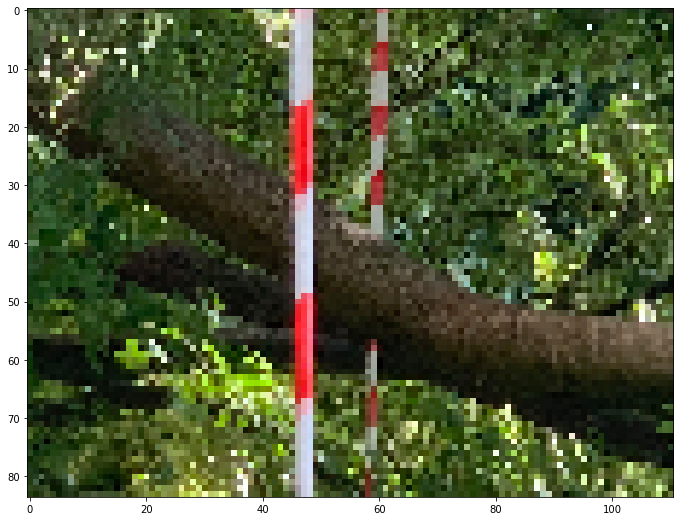

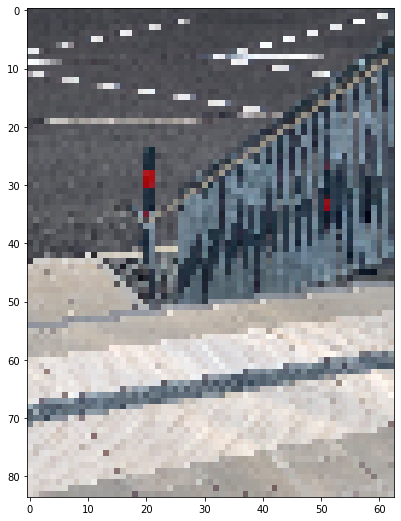

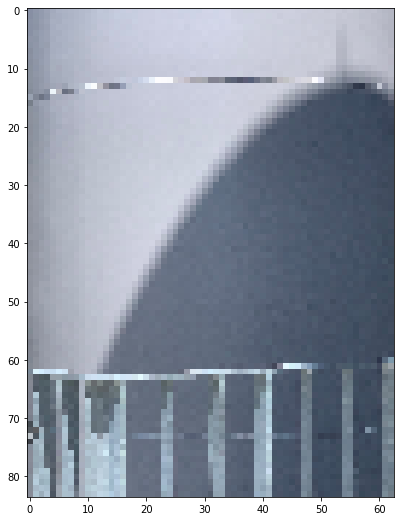

In [16]:
feats = []
files = os.listdir(imgs_path)
for findex, file in enumerate(files): 
    filepath = os.path.join(imgs_path, file)
    image = read_image(filepath)
    scale_factor = target_shape[1] / image.shape[1]
    image = torch.nn.functional.interpolate(image.unsqueeze(0).float(), scale_factor=scale_factor, mode="bilinear").int().squeeze()
    feat= file.replace(".jpg", ".pt")
    print("progress:", findex/len(files), image.shape, image.shape == target_shape, )
    torch.save(image, os.path.join(feats_path, feat))
    if image.shape == target_shape:
        feats.append(feat)
        
    plt.figure(figsize= (12, 9))
    plt.imshow(image.transpose(1,0).transpose(1,2))
#     if findex == 15:
#         break

In [10]:
#cleaned_files = []
#for file in feats: 
#    filepath = os.path.join(imgs_path, file)
#    image = read_image(filepath) 
#    if image.shape == target_shape:
#        cleaned_files.append(file)
#    
#    print( image.shape)
#    break
#files = cleaned_files

In [6]:
df = pd.DataFrame({"feats": feats})
df.to_csv(os.path.join("F:", "filelist_feats.txt"), index=False,header=False)
df[:20].to_csv(os.path.join("F:", "filelist_feats_small.txt"), index=False,header=False)
df

,feats
0,IMG_5298.pt
1,IMG_5307.pt
2,IMG_5342.pt
3,IMG_5345.pt
4,IMG_5348.pt
...,...
281,IMG_9922.pt
282,IMG_9945.pt
283,IMG_9961.pt
284,IMG_9966.pt


# create dataset and dataloader

In [4]:
class CustomImageDataset(Dataset):
    def __init__(self, img_filelist, img_dir="/"):
        self.img_dir = img_dir
        self.img_paths = pd.read_csv(img_filelist, header=None)

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_paths.iloc[idx, 0])
        image = read_image(img_path)
        return image

class CustomImageFeatDataset(Dataset):
    def __init__(self, img_filelist, img_dir="/"):
        self.img_dir = img_dir
        self.img_paths = pd.read_csv(img_filelist, header=None)

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_paths.iloc[idx, 0])
        image = torch.load(img_path)
        return image

In [5]:
img_filelist = os.path.join("F:", "filelist_feats_small.txt")
dataset = CustomImageFeatDataset(img_filelist, "F:\\Features")

In [6]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(dataset, batch_size=16, shuffle=True)

In [7]:
train_features = next(iter(train_dataloader))

In [8]:
train_features.shape

torch.Size([16, 3, 504, 378])

In [9]:
image = train_features[0]
image = image.transpose(0, 1)
image = image.transpose(1, 2)
image.shape

torch.Size([504, 378, 3])

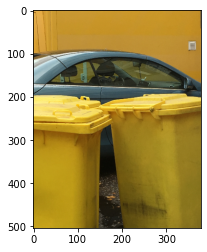

In [16]:
plt.figure(figsize=(3,4))
plt.imshow(image.numpy()[:,:,:] , aspect="auto", cmap="gray")

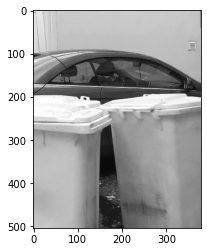

In [17]:
plt.figure(figsize=(3,4))
plt.imshow(image.numpy()[:,:,0] , aspect="auto", cmap="gray")

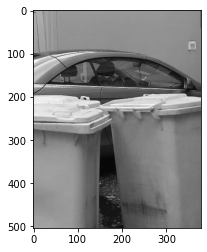

In [18]:
plt.figure(figsize=(3,4))
plt.imshow(image.numpy()[:,:,1] , aspect="auto", cmap="gray")

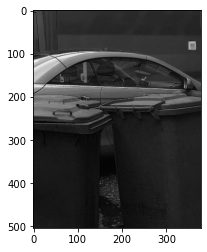

In [19]:
plt.figure(figsize=(3,4))
plt.imshow(image.numpy()[:,:,2] , aspect="auto", cmap="gray")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


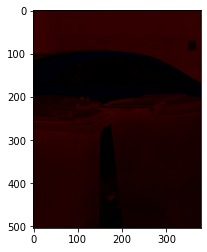

In [25]:
plt.figure(figsize=(3,4))
plt.imshow(image.numpy()[:,:,:] - image.numpy()[:,:,1, None] , aspect="auto", cmap="gray")